# Urbanpy model for Para

Start date: 2022-02-09

In [1]:
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (10,10)


import sys
sys.path.append('..')

import urbanpy as up
import geopandas as gpd
import numpy as np
import pandas as pd
import shapely
import plotly.express as px 
import osmnx as ox

from tqdm.notebook import tqdm
tqdm.pandas()

from pandarallel import pandarallel

pandarallel.initialize(progress_bar=True)

INFO: Pandarallel will run on 8 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [4]:
state = 'Pará, Brazil'
para = up.download.nominatim_osm(state)

Text(0.5, 1.0, 'Pará, Brazil')

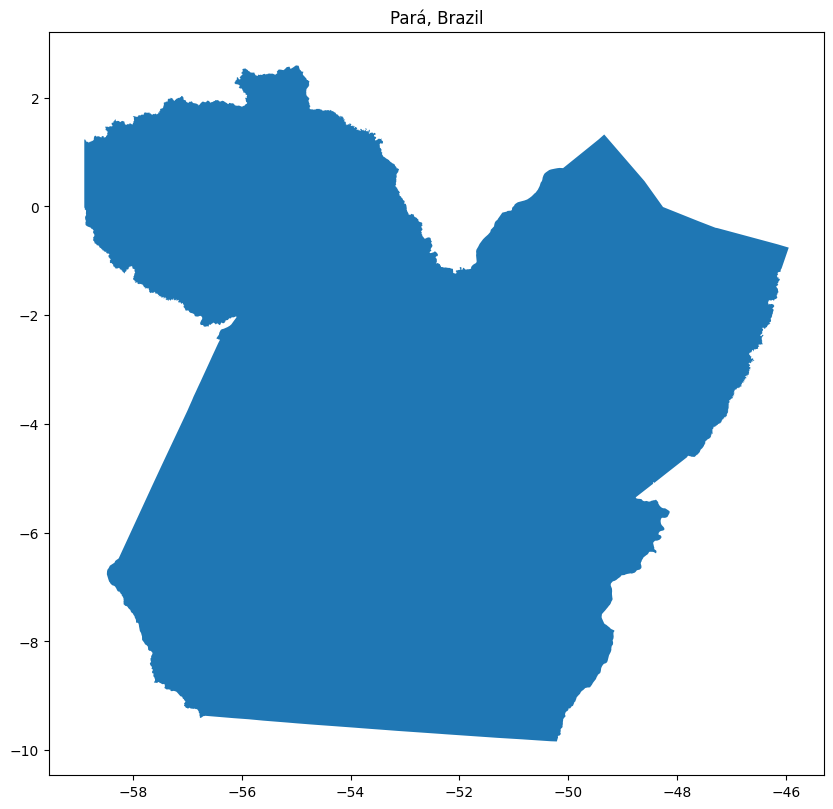

In [5]:
para.plot()
plt.title(state)

## Divide Para into hexagons for spatial analysis

I've selected lower resolution here to ensure the model doesn't run for too long

In [8]:
h3_resolution = 6

hex_para = up.geom.gen_hexagons(h3_resolution, city=para)

In [9]:
hex_para.head()

,hex,geometry
0,868141a27ffffff,"POLYGON ((-50.73466 -7.99253, -50.70650 -7.969..."
1,868a82a9fffffff,"POLYGON ((-55.35635 -3.55610, -55.32908 -3.533..."
2,868069277ffffff,"POLYGON ((-53.39090 0.15305, -53.36343 0.17602..."
3,86806a95fffffff,"POLYGON ((-51.32238 -0.69149, -51.29457 -0.668..."
4,868aa30d7ffffff,"POLYGON ((-57.05353 -5.66418, -57.02652 -5.642..."


In [10]:
hex_para.shape

(31371, 2)

## Download population data

In [11]:
pop_brazil_youth = up.download.hdx_fb_population('brazil', 'youth')

Filter the data so it's just constrained to the state of Para

In [12]:
pop_para = up.geom.filter_population(pop_brazil_youth, para)

## Calculate population per hexagon

In [13]:
hex_para = up.geom.merge_shape_hex(
    hexs = hex_para, 
    shape = pop_para, 
    agg={'population': 'sum'}
)

## Visualize data on a static map

Text(0.5, 1.0, 'Pará, Brazil. Youth population')

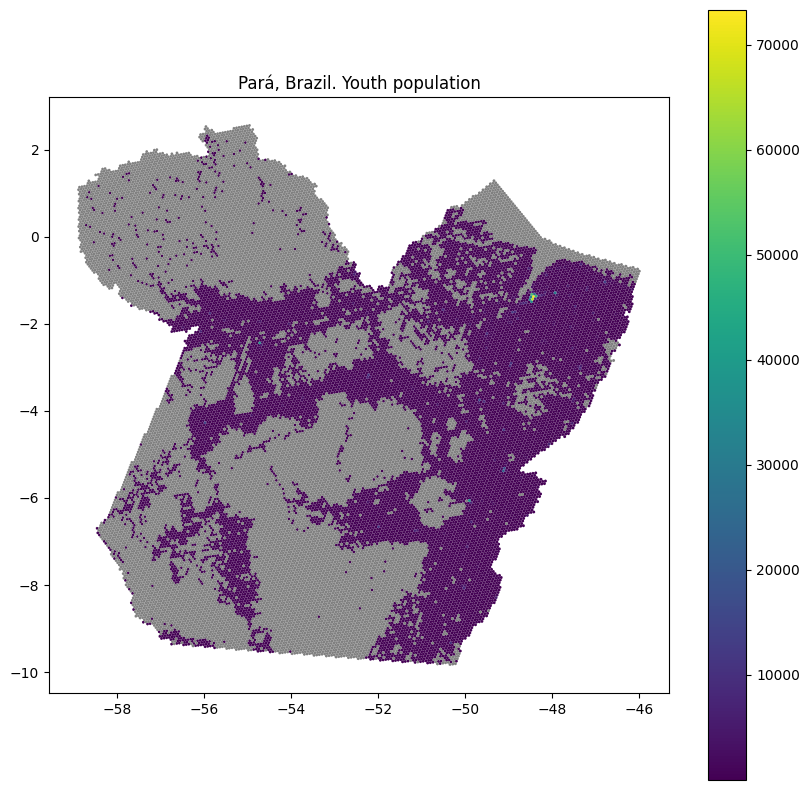

In [14]:
hex_para.plot('population', legend=True, missing_kwds={'color':'grey'})
plt.title(state + ". Youth population")

## Visualize data on interactive map

In [18]:
fig = up.plotting.choropleth_map(
    hex_para, 
    'population', 
    title=state + '. Youth population - 2020', 
    zoom = 4, 
    color_continuous_scale="Viridis",
    opacity=0.8,
    labels={'population':'Population 2020'}                                 
)

fig.update_layout(
    margin=dict(l=0, r=0, t=30, b=0),
)

fig.show()

## Urban accessibility

In [19]:
state_ua = 'Para, Brazil'

ba_para = up.download.nominatim_osm(state_ua)

In [20]:
ba_para.total_bounds

array([-58.897    ,  -9.8390248, -45.9437937,   2.5909298])

In [21]:
es_para = up.download.overpass_pois(bounds=ba_para.total_bounds, facilities='education')

Inspect the education data for Para, the points of interest (poi_types) shows all the different education facilities

In [22]:
es_para.head()

,type,id,lat,lon,tags,geometry,poi_type
0,node,259201773,-1.067063,-46.762858,"{'amenity': 'school', 'created_by': 'JOSM', 'n...",POINT (-46.76286 -1.06706),school
1,node,262553369,-1.049039,-46.766407,"{'amenity': 'school', 'created_by': 'JOSM', 'n...",POINT (-46.76641 -1.04904),school
2,node,274387317,-1.459240,-48.434214,"{'amenity': 'university', 'internet_access': '...",POINT (-48.43421 -1.45924),university
3,node,301443881,-1.077599,-46.762816,"{'amenity': 'school', 'name': 'Escola Amigos p...",POINT (-46.76282 -1.07760),school
4,node,356923418,-1.086975,-46.862982,"{'amenity': 'school', 'name': 'Escola Raimunda...",POINT (-46.86298 -1.08698),school


Count the different types of education facilities in Para

In [24]:
es_para.poi_type.value_counts()

school                 1956
university               33
college                  12
driving_school           10
kindergarten              6
language_school           2
music_school              2
trade_school              1
fire_station;school       1
Name: poi_type, dtype: int64

## Evaluate Accessibility

In [25]:
schools_para = es_para[es_para['poi_type'].isin(['school', 'kindergarten', 'language_school', 'library'])]

In [26]:
hex_para['lat'] = hex_para.geometry.centroid.y
hex_para['lon'] = hex_para.geometry.centroid.x

In [27]:
dist_up, ind_up = up.utils.nn_search(
    tree_features=schools_para[['lat', 'lon']].values, # These are the schools
    query_features=hex_para[['lat', 'lon']].values, # Values are the centroids of each hexagon
    metric='haversine'
)

This adds new column to indicate the index of the closest school for a particular hexagon

In [29]:
hex_para['closest_school'] = ind_up

## Start the OSRM server

In [30]:
up.routing.start_osrm_server('sul', 'south-america_brazil', 'foot')

[
    {
        "Id": "2ce75c74142e442dd48ae9fca40443482527d419f2424e49a3e694cdd1576e07",
        "Created": "2023-02-09T21:02:43.763604512Z",
        "Path": "osrm-routed",
        "Args": [
            "--algorithm",
            "mld",
            "/data/sul-latest.osm.pbf"
        ],
        "State": {
            "Status": "exited",
            "Running": false,
            "Paused": false,
            "Restarting": false,
            "OOMKilled": false,
            "Dead": false,
            "Pid": 0,
            "ExitCode": 255,
            "Error": "",
            "StartedAt": "2023-02-15T22:31:21.527061506Z",
            "FinishedAt": "2023-02-16T17:05:59.122959083Z"
        },
        "Image": "sha256:6e654e0e06b3b580457ae3bae43474c86f10d46eeb8b1b89899e5714eff19938",
        "ResolvConfPath": "/var/lib/docker/containers/2ce75c74142e442dd48ae9fca40443482527d419f2424e49a3e694cdd1576e07/resolv.conf",
        "HostnamePath": "/var/lib/docker/containers/2ce75c74142e442dd48ae9fca404

In [31]:
distance_duration_para = hex_para.parallel_apply(
    lambda row: up.routing.osrm_route(
        origin=row.geometry.centroid, 
        destination = schools_para.iloc[row['closest_school']]['geometry']
    ),
    result_type='expand',
    axis=1,
)

Process ForkPoolWorker-7:
Process ForkPoolWorker-8:
Process ForkPoolWorker-2:
Process ForkPoolWorker-9:
Process ForkPoolWorker-5:
Process ForkPoolWorker-3:
Process ForkPoolWorker-4:
Process ForkPoolWorker-6:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/opt/homebrew/Cellar/python@3.10/3.10.9/Frameworks/Python.framework/Versions/3.10/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/homebrew/Cellar/python@3.10/3.10.9/Frameworks/Python.framework/Versions/3.10/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/opt/homebrew/Cellar/python@3.10/3.10.9/Frameworks/Python.framework/Versions/3.10/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self

KeyboardInterrupt: 

  File "/opt/homebrew/Cellar/python@3.10/3.10.9/Frameworks/Python.framework/Versions/3.10/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/homebrew/Cellar/python@3.10/3.10.9/Frameworks/Python.framework/Versions/3.10/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/homebrew/Cellar/python@3.10/3.10.9/Frameworks/Python.framework/Versions/3.10/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/homebrew/Cellar/python@3.10/3.10.9/Frameworks/Python.framework/Versions/3.10/lib/python3.10/multiprocessing/pool.py", line 125, in worker
    result = (True, func(*args, **kwds))
  File "/opt/homebrew/Cellar/python@3.10/3.10.9/Frameworks/Python.framework/Versions/3.10/lib/python3.10/multiprocessing/pool.py", line 125, in worker
    result = (True, func(*args, **kwds))
  File "/opt/homebrew/Cel

  File "/opt/homebrew/lib/python3.10/site-packages/pandarallel/core.py", line 158, in __call__
    results = self.work_function(
  File "/opt/homebrew/lib/python3.10/site-packages/pandarallel/core.py", line 158, in __call__
    results = self.work_function(
  File "/opt/homebrew/lib/python3.10/site-packages/pandarallel/data_types/dataframe.py", line 32, in work
    return data.apply(
  File "/opt/homebrew/lib/python3.10/site-packages/pandarallel/data_types/dataframe.py", line 32, in work
    return data.apply(
  File "/opt/homebrew/lib/python3.10/site-packages/pandarallel/data_types/dataframe.py", line 32, in work
    return data.apply(
  File "/opt/homebrew/lib/python3.10/site-packages/pandarallel/data_types/dataframe.py", line 32, in work
    return data.apply(
  File "/opt/homebrew/lib/python3.10/site-packages/pandarallel/data_types/dataframe.py", line 32, in work
    return data.apply(
  File "/opt/homebrew/lib/python3.10/site-packages/pandarallel/data_types/dataframe.py", line 32,

## Inspect results

distance_duration.head()